# Loading packages

In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns

from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import datetime as dt
import random 
import os
import time 
import warnings
warnings.filterwarnings('ignore')


from torch.autograd import Variable
from fastprogress import progress_bar

plt.style.use('bmh')
from itertools import cycle
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

# Loading the data

In [2]:
INPUT_DIR = '../data/'
calendar = pd.read_csv(f'{INPUT_DIR}/calendar.csv')
selling_prices = pd.read_csv(f'{INPUT_DIR}/sell_prices.csv')
sales_train_val = pd.read_csv(f'{INPUT_DIR}/sales_train_validation.csv')
sales_train_eval = pd.read_csv(f'{INPUT_DIR}/sales_train_evaluation.csv')

In [3]:
print(calendar.shape)
calendar.head()

(1969, 14)


,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [4]:
print(selling_prices.shape)
selling_prices.head()

(6841121, 4)


,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [5]:
print(sales_train_val.shape)
sales_train_val.head()

(30490, 1919)


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [6]:
print(sales_train_eval.shape)
sales_train_eval.head()


(30490, 1947)


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0


In [7]:
day_cols = sales_train_val.columns[sales_train_val.columns.str.contains("d_")].values
ids_cols = sales_train_val.columns[sales_train_val.columns.str.contains("d_")==False].values

In [8]:
print(ids_cols.shape)
ids_cols

(6,)


array(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'],
      dtype=object)

In [9]:
sales_train_val[day_cols]

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,0,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,0,0,0,0,0,0,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,0,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0,2,2,0,3,1,4,1,0,...,2,0,0,0,0,0,1,0,0,1
30486,0,0,0,0,0,5,0,1,1,3,...,0,0,0,0,0,0,0,0,1,0
30487,0,6,0,2,2,4,1,8,5,2,...,2,1,0,2,0,1,0,0,1,0
30488,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


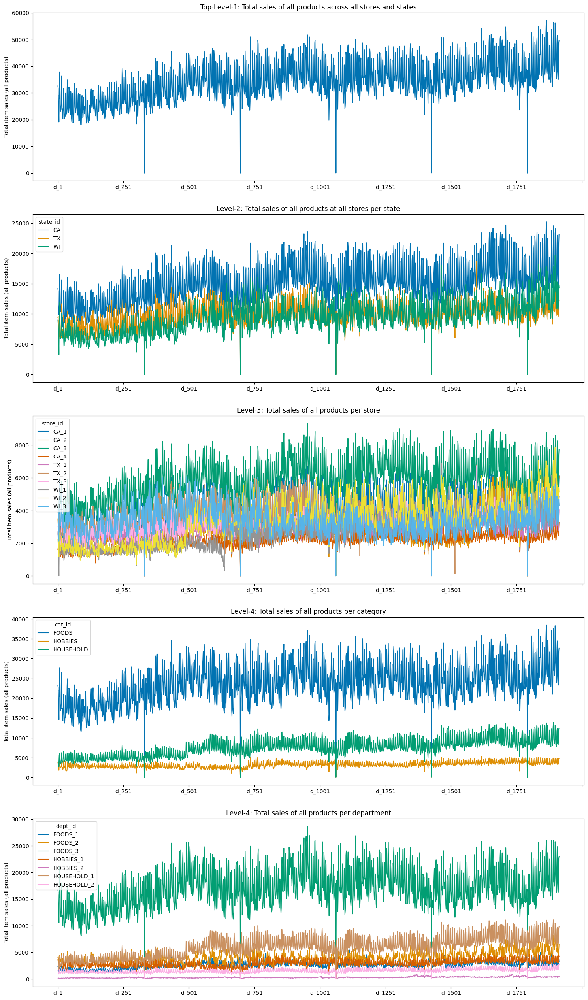

In [10]:
sns.set_palette("colorblind")

fig, ax = plt.subplots(5,1,figsize=(18,32))
sales_train_val[day_cols].sum().plot(ax=ax[0])
ax[0].set_title("Top-Level-1: Total sales of all products across all stores and states")
ax[0].set_ylabel("Total item sales (all products)");
sales_train_val.groupby("state_id")[day_cols].sum().transpose().plot(ax=ax[1])
ax[1].set_title("Level-2: Total sales of all products at all stores per state");
ax[1].set_ylabel("Total item sales (all products)");
sales_train_val.groupby("store_id")[day_cols].sum().transpose().plot(ax=ax[2])
ax[2].set_title("Level-3: Total sales of all products per store")
ax[2].set_ylabel("Total item sales (all products)");
sales_train_val.groupby("cat_id")[day_cols].sum().transpose().plot(ax=ax[3])
ax[3].set_title("Level-4: Total sales of all products per category")
ax[3].set_ylabel("Total item sales (all products)");
sales_train_val.groupby("dept_id")[day_cols].sum().transpose().plot(ax=ax[4])
ax[4].set_title("Level-4: Total sales of all products per department")
ax[4].set_ylabel("Total item sales (all products)");

# Prophet

The goal here is to predict the last month of total sales in the train_eval dataset

In [11]:
time_series = sales_train_val[day_cols].sum().values
len(time_series)

1913

In [12]:
time_series

array([32631, 31749, 23783, ..., 40517, 48962, 49795])

### Split the time series to training and validation subsets

In [13]:
train_time_series = time_series[0:-30]
eval_time_series = time_series[-30::]
print(len(train_time_series), len(eval_time_series))
days = np.arange(1, len(day_cols)+1)

1883 30


Let us plot the total sales for each day

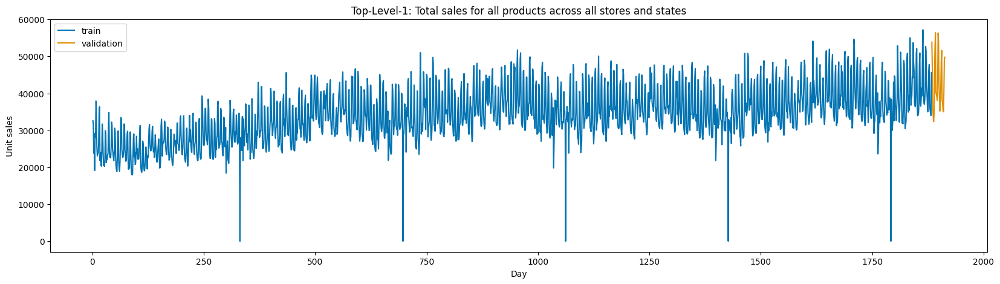

In [14]:
plt.figure(figsize=(20,5))
plt.plot(days[0:-30], train_time_series, label="train")
plt.plot(days[-30::], eval_time_series, label="validation")
plt.title("Top-Level-1: Total sales for all products across all stores and states");
plt.legend()
plt.xlabel("Day")
plt.ylabel("Unit sales");

Now, I will convert the days to actual dates using `calendar.csv`

In [15]:
dates = calendar.iloc[0:len(time_series)].date.values
df = pd.DataFrame(dates, columns=["ds"])
df.loc[:, "y"] = time_series
df.head()

,ds,y
0,2011-01-29,32631
1,2011-01-30,31749
2,2011-01-31,23783
3,2011-02-01,25412
4,2011-02-02,19146


In [16]:
train_df = df.iloc[0:-30]
train_df.shape

(1883, 2)

In [17]:
eval_df = df.iloc[-30:]
eval_df.shape

(30, 2)

In [18]:
uncertainty_interval_width = 0.1

In [19]:
m = Prophet(interval_width=uncertainty_interval_width)
m.fit(train_df)
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
forecast.head()

16:41:08 - cmdstanpy - INFO - Chain [1] start processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2011-01-29,23479.242084,30068.601344,30950.276090,23479.242084,23479.242084,6944.854223,6944.854223,6944.854223,7173.910351,7173.910351,7173.910351,-229.056129,-229.056129,-229.056129,0.0,0.0,0.0,30424.096307
1,2011-01-30,23492.802415,29796.761996,30586.128593,23492.802415,23492.802415,6607.195431,6607.195431,6607.195431,6747.495994,6747.495994,6747.495994,-140.300563,-140.300563,-140.300563,0.0,0.0,0.0,30099.997846
2,2011-01-31,23506.362746,21407.936995,22481.630700,23506.362746,23506.362746,-1488.605370,-1488.605370,-1488.605370,-1439.248814,-1439.248814,-1439.248814,-49.356556,-49.356556,-49.356556,0.0,0.0,0.0,22017.757376
3,2011-02-01,23519.923076,19284.663359,20030.487864,23519.923076,23519.923076,-3901.158801,-3901.158801,-3901.158801,-3944.869167,-3944.869167,-3944.869167,43.710366,43.710366,43.710366,0.0,0.0,0.0,19618.764275
4,2011-02-02,23533.483407,19003.770130,19860.590489,23533.483407,23533.483407,-4149.595876,-4149.595876,-4149.595876,-4288.280989,-4288.280989,-4288.280989,138.685113,138.685113,138.685113,0.0,0.0,0.0,19383.887531


In [20]:
col_int = ['ds', 'yhat', 'yhat_lower', 'yhat_upper']
forecast[col_int].head()

,ds,yhat,yhat_lower,yhat_upper
0,2011-01-29,30424.096307,30068.601344,30950.276090
1,2011-01-30,30099.997846,29796.761996,30586.128593
2,2011-01-31,22017.757376,21407.936995,22481.630700
3,2011-02-01,19618.764275,19284.663359,20030.487864
4,2011-02-02,19383.887531,19003.770130,19860.590489


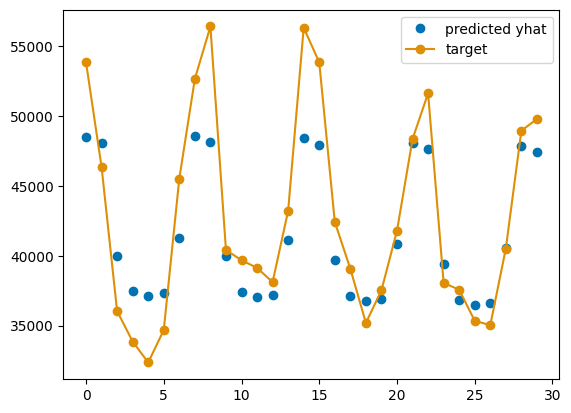

In [21]:
plt.plot(forecast.iloc[-30::].yhat.values, 'o', label="predicted yhat")
plt.plot(eval_df.y.values, 'o-', label="target")
plt.legend();

In [36]:
eval_df.y.values

array([53863, 46360, 36041, 33857, 32359, 34681, 45536, 52672, 56425,
       40418, 39683, 39134, 38116, 43220, 56340, 53856, 42427, 39069,
       35193, 37529, 41789, 48362, 51640, 38059, 37570, 35343, 35033,
       40517, 48962, 49795])

In [37]:
forecast.iloc[-30::].yhat.values

array([48498.31019568, 48107.45118929, 39950.27657444, 37467.63189966,
       37140.17179838, 37324.79027078, 41301.82204996, 48606.52542431,
       48167.30017885, 39961.23064993, 37430.32918995, 37056.34492733,
       37197.16535291, 41133.99278385, 48402.8067646 , 47932.56661224,
       39700.74448552, 37149.56448991, 36760.81274436, 36892.24580627,
       40824.77920136, 48093.96665397, 47628.22361701, 39404.38474841,
       36863.97001206, 36488.0234203 , 36633.55085907, 40580.73777061,
       47864.45633146, 47412.51481072])

In [35]:
np.sqrt(((eval_df.y.values - forecast.iloc[-30::].yhat.values ) ** 2).mean())

3414.0482209452157

In [22]:
fig = plot_plotly(m, forecast)  
py.iplot(fig)

# LSTM

## First initial model

In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [24]:
if not torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

device

device(type='cpu')

In [25]:
class MyLSTM(nn.Module):
    
    def __init__(self, input_dim, hidden_dim, batch_size, num_layers=1, output_dim=1):
        super().__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.batch_size = batch_size
        self.num_layers = num_layers
        
        self.lstm = nn.LSTM(input_size=self.input_dim,
                            hidden_size=self.hidden_dim,
                            num_layers=self.num_layers,
                            dropout = 0.25)
        self.linear = nn.Linear(self.hidden_dim, output_dim)
        
    def init_hidden(self):
        self.h_zero = torch.zeros(self.num_layers, self.batch_size, self.hidden_dim).to(device)
        self.c_zero = torch.zeros(self.num_layers, self.batch_size, self.hidden_dim).to(device)
    
    def forward(self, x):
        lstm_output, (h_n, c_n) = self.lstm(x.view(len(x), self.batch_size, -1),
                                           (self.h_zero, self.c_zero))
        last_time_step = lstm_output.view(self.batch_size, len(x), self.hidden_dim)[-1]
        pred = self.linear(last_time_step)
        return pred
    

def train_model(model, data_dict, lr=1e-4, num_epochs=500):
    
    loss_fun = torch.nn.MSELoss(reduction="mean")
    optimiser = torch.optim.Adam(model.parameters(), lr=lr)
    
    train_losses = np.zeros(num_epochs)
    phases = ["train", "eval"]
    losses_dict = {"train": [], "eval": []}
    predictions_dict = {"train": [], "eval": [] }
    
    for n in range(num_epochs):
        
        for phase in phases:
            
            x = data_dict[phase]["input"].to(device, dtype=torch.float)
            y = data_dict[phase]["target"].to(device, dtype=torch.float)
            
            if phase == "train":
                model.train()
            else:
                model.eval()
        
            optimiser.zero_grad()
            
            model.init_hidden()
            y_pred = model(x)
            
            if n == (num_epochs-1):
                predictions_dict[phase] = y_pred.float().cpu().detach().numpy()
            
            loss = loss_fun(y_pred.float(), y)
            losses_dict[phase].append(loss.item())
            
            if n % 50 == 0:
                print("{} loss: {}".format(phase, loss.item()))
            
            if phase == 'train':
                loss.backward()
                optimiser.step()
        
    return losses_dict, predictions_dict

def create_sequences(timeseries, seq_len):
    inputs = []
    targets = []
    
    max_steps = len(timeseries) - (seq_len+1)
    
    for t in range(max_steps):
        x = timeseries[t:(t+seq_len)]
        y = timeseries[t+seq_len]
        inputs.append(x)
        targets.append(y)
    
    return np.array(inputs), np.array(targets)

## The top timeseries - preprocessing <a class="anchor" id="preprocessing"></a>

Let's use the timeseries of total unit sales as an example again. For preprocessing we should remove the trend and scale the values.

In [26]:
# diff_series = np.diff(time_series)
diff_series = time_series
train_size = int(0.7 * len(diff_series))
train_diff_series = diff_series[0:train_size]
eval_diff_series = diff_series[train_size::]
scaler = MinMaxScaler(feature_range=(-1,1))
scaled_train = scaler.fit_transform(train_diff_series.reshape(-1, 1))
scaled_eval = scaler.transform(eval_diff_series.reshape(-1,1))

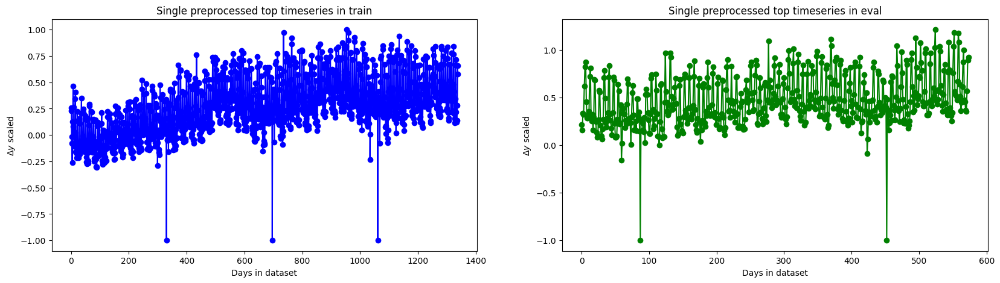

In [27]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
ax[0].plot(scaled_train, '-o', c="b")
ax[1].plot(scaled_eval, '-o', c="g")
ax[0].set_title("Single preprocessed top timeseries in train")
ax[1].set_title("Single preprocessed top timeseries in eval");
ax[0].set_xlabel("Days in dataset")
ax[1].set_xlabel("Days in dataset")
ax[0].set_ylabel("$\Delta y$ scaled")
ax[1].set_ylabel("$\Delta y$ scaled");

In [28]:
seq_len = 400
input_dim = 1
hidden_dim = 128
num_epochs = 600
lr=0.0005


x_train, y_train = create_sequences(scaled_train, seq_len)
x_eval, y_eval = create_sequences(scaled_eval, seq_len)

x_train = torch.from_numpy(x_train).float()
y_train = torch.from_numpy(y_train).float()
x_eval = torch.from_numpy(x_eval).float()
y_eval = torch.from_numpy(y_eval).float()

data_dict = {"train": {"input": x_train, "target": y_train},
             "eval": {"input": x_eval, "target": y_eval}}

In [29]:
model = MyLSTM(input_dim=input_dim,
               hidden_dim=hidden_dim,
               batch_size=seq_len)
model = model.to(device)

/Users/zak/anaconda3/envs/DataCamp/lib/python3.11/site-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25 and num_layers=1



In [30]:
run_training = True
if run_training:
    losses_dict, predictions_dict = train_model(model, data_dict, num_epochs=num_epochs, lr=lr)

train loss: 0.2683011293411255
eval loss: 0.4597690999507904
eval loss: 0.4597690999507904
train loss: 0.055591557174921036
train loss: 0.055591557174921036
eval loss: 0.09854008257389069
eval loss: 0.09854008257389069
train loss: 0.05508233979344368
train loss: 0.05508233979344368
eval loss: 0.10111555457115173
eval loss: 0.10111555457115173
train loss: 0.05415721237659454
train loss: 0.05415721237659454
eval loss: 0.09867656230926514
eval loss: 0.09867656230926514
train loss: 0.05039114132523537
train loss: 0.05039114132523537
eval loss: 0.08775505423545837
eval loss: 0.08775505423545837
train loss: 0.022643916308879852
train loss: 0.022643916308879852
eval loss: 0.06119638308882713
eval loss: 0.06119638308882713
train loss: 0.019682787358760834
train loss: 0.019682787358760834
eval loss: 0.054932400584220886
eval loss: 0.054932400584220886
train loss: 0.01724744588136673
train loss: 0.01724744588136673
eval loss: 0.048551615327596664
eval loss: 0.048551615327596664
train loss: 0.016

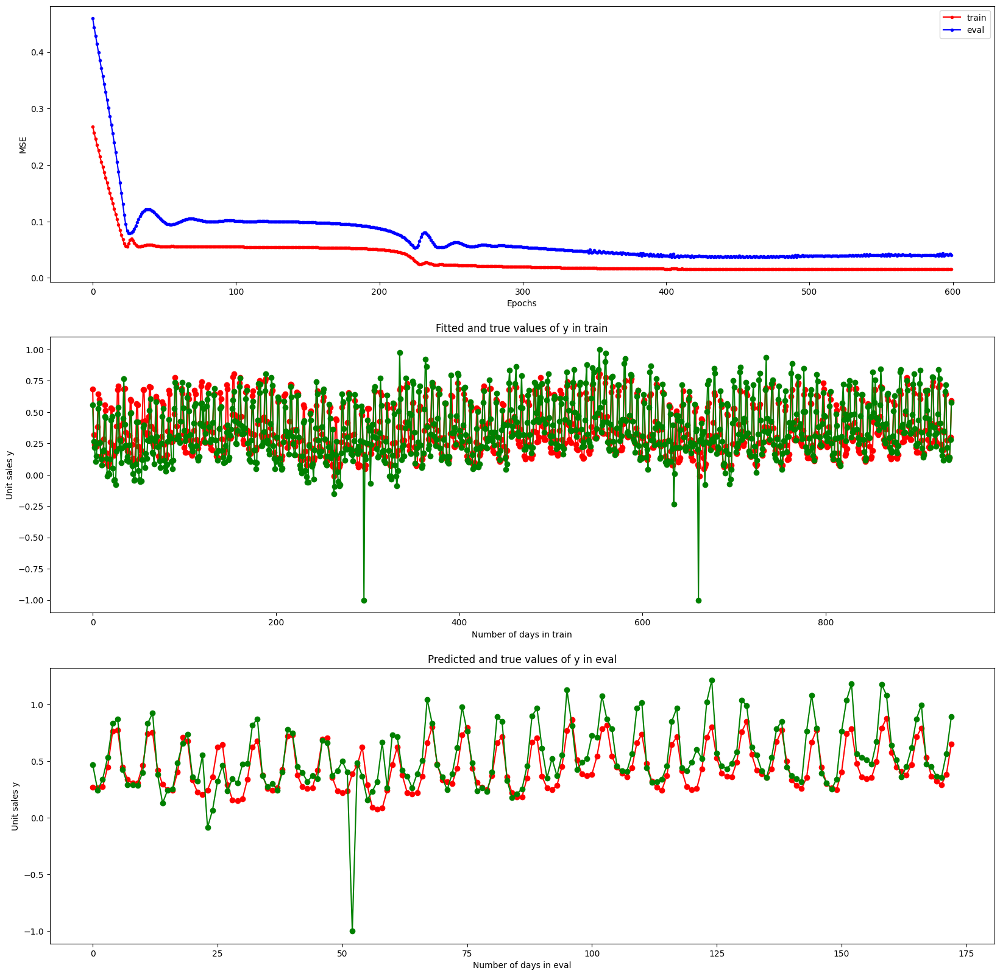

In [31]:
if run_training:
    
    fig, ax = plt.subplots(3,1,figsize=(20,20))
    ax[0].plot(losses_dict["train"], '.-', label="train", c="red")
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("MSE")
    ax[0].plot(losses_dict["eval"], '.-', label="eval", c="blue");
    ax[0].legend();

    ax[1].plot(predictions_dict["train"], '-o', c="red")
    ax[1].plot(y_train, '-o', c="green")
    ax[1].set_title("Fitted and true values of y in train");
    ax[1].set_ylabel("Unit sales y");
    ax[1].set_xlabel("Number of days in train");

    ax[2].plot(predictions_dict["eval"], '-o', c="red")
    ax[2].plot(y_eval, '-o', c="green")
    ax[2].set_title("Predicted and true values of y in eval");
    ax[2].set_xlabel("Number of days in eval");
    ax[2].set_ylabel("Unit sales y");

## Test RSME

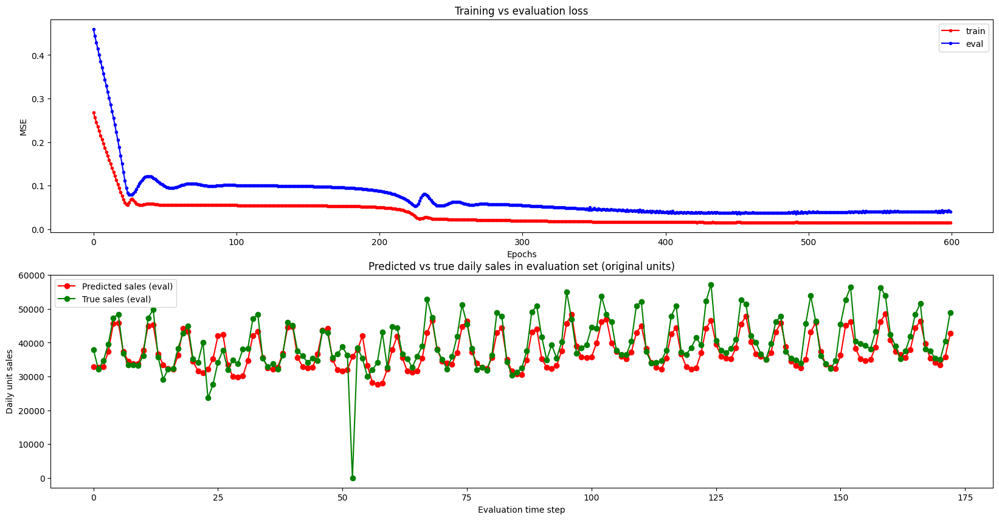

In [32]:
preds_eval_inv = scaler.inverse_transform(predictions_dict["eval"])

y_eval_inv = scaler.inverse_transform(y_eval.numpy().reshape(-1, 1))



if run_training:

    fig, ax = plt.subplots(2,1,figsize=(20,10))



    # Loss curves

    ax[0].plot(losses_dict["train"], '.-', label="train", c="red")

    ax[0].plot(losses_dict["eval"],  '.-', label="eval",  c="blue")

    ax[0].set_xlabel("Epochs")

    ax[0].set_ylabel("MSE")

    ax[0].set_title("Training vs evaluation loss")

    ax[0].legend();



    # Predicted vs true sales in eval (original scale)

    ax[1].plot(preds_eval_inv, '-o', c="red",  label="Predicted sales (eval)")

    ax[1].plot(y_eval_inv,     '-o', c="green", label="True sales (eval)")

    ax[1].set_title("Predicted vs true daily sales in evaluation set (original units)")

    ax[1].set_xlabel("Evaluation time step")

    ax[1].set_ylabel("Daily unit sales")

    ax[1].legend();


In [40]:
preds_eval_inv[-30:]

array([[35020.125],
       [43096.117],
       [45937.94 ],
       [37446.65 ],
       [33672.887],
       [32668.387],
       [32322.004],
       [36249.895],
       [45038.176],
       [46154.977],
       [38281.242],
       [35140.332],
       [34760.117],
       [35003.723],
       [38653.61 ],
       [46235.727],
       [48561.656],
       [40768.684],
       [37403.715],
       [36489.703],
       [35659.74 ],
       [37991.047],
       [44304.27 ],
       [46350.07 ],
       [39628.887],
       [35347.09 ],
       [34191.13 ],
       [33384.5  ],
       [35739.273],
       [42704.844]], dtype=float32)

In [41]:
y_eval_inv[-30:]

array([[45611.   ],
       [53863.   ],
       [46360.   ],
       [36041.   ],
       [33857.   ],
       [32359.   ],
       [34681.   ],
       [45536.   ],
       [52672.   ],
       [56424.996],
       [40418.   ],
       [39683.   ],
       [39134.   ],
       [38116.   ],
       [43220.   ],
       [56340.004],
       [53856.   ],
       [42427.   ],
       [39069.   ],
       [35193.   ],
       [37529.   ],
       [41789.   ],
       [48362.   ],
       [51640.   ],
       [38059.   ],
       [37570.   ],
       [35343.   ],
       [35033.   ],
       [40517.   ],
       [48962.   ]], dtype=float32)

In [42]:
np.sqrt(((y_eval_inv[-30:] - preds_eval_inv[-30:] ) ** 2).mean())

5272.3145

## More advanced models

In [43]:
INPUT_DIR_PATH = '../data/'

In [44]:
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics: 
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df


def read_data():
    sell_prices_df = pd.read_csv(INPUT_DIR_PATH + 'sell_prices.csv')
    sell_prices_df = reduce_mem_usage(sell_prices_df)
    print('Sell prices has {} rows and {} columns'.format(sell_prices_df.shape[0], sell_prices_df.shape[1]))

    calendar_df = pd.read_csv(INPUT_DIR_PATH + 'calendar.csv')
    calendar_df = reduce_mem_usage(calendar_df)
    print('Calendar has {} rows and {} columns'.format(calendar_df.shape[0], calendar_df.shape[1]))

    sales_train_validation_df = pd.read_csv(INPUT_DIR_PATH + 'sales_train_validation.csv')
    print('Sales train validation has {} rows and {} columns'.format(sales_train_validation_df.shape[0], sales_train_validation_df.shape[1]))

    submission_df = pd.read_csv(INPUT_DIR_PATH + 'sample_submission.csv')
    return sell_prices_df, calendar_df, sales_train_validation_df, submission_df
    

In [45]:
_,  calendar_df, sales_train_validation_df, _ = read_data()

Mem. usage decreased to 130.48 Mb (37.5% reduction)
Sell prices has 6841121 rows and 4 columns
Mem. usage decreased to  0.12 Mb (41.9% reduction)
Calendar has 1969 rows and 14 columns
Sales train validation has 30490 rows and 1919 columns


In [48]:
#Create date index
date_index = calendar_df['date']
dates = date_index[0:1913]
dates_list = [dt.datetime.strptime(date, '%Y-%m-%d').date() for date in dates]

In [49]:
# Create a data frame for items sales per day with item ids (with Store Id) as columns names  and dates as the index 
sales_train_validation_df['item_store_id'] = sales_train_validation_df.apply(lambda x: x['item_id']+'_'+x['store_id'],axis=1)
DF_Sales = sales_train_validation_df.loc[:,'d_1':'d_1913'].T
DF_Sales.columns = sales_train_validation_df['item_store_id'].values

#Set Dates as index 
DF_Sales = pd.DataFrame(DF_Sales).set_index([dates_list])
DF_Sales.index = pd.to_datetime(DF_Sales.index)
DF_Sales.head()

,HOBBIES_1_001_CA_1,HOBBIES_1_002_CA_1,HOBBIES_1_003_CA_1,HOBBIES_1_004_CA_1,HOBBIES_1_005_CA_1,HOBBIES_1_006_CA_1,HOBBIES_1_007_CA_1,HOBBIES_1_008_CA_1,HOBBIES_1_009_CA_1,HOBBIES_1_010_CA_1,...,FOODS_3_818_WI_3,FOODS_3_819_WI_3,FOODS_3_820_WI_3,FOODS_3_821_WI_3,FOODS_3_822_WI_3,FOODS_3_823_WI_3,FOODS_3_824_WI_3,FOODS_3_825_WI_3,FOODS_3_826_WI_3,FOODS_3_827_WI_3
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0


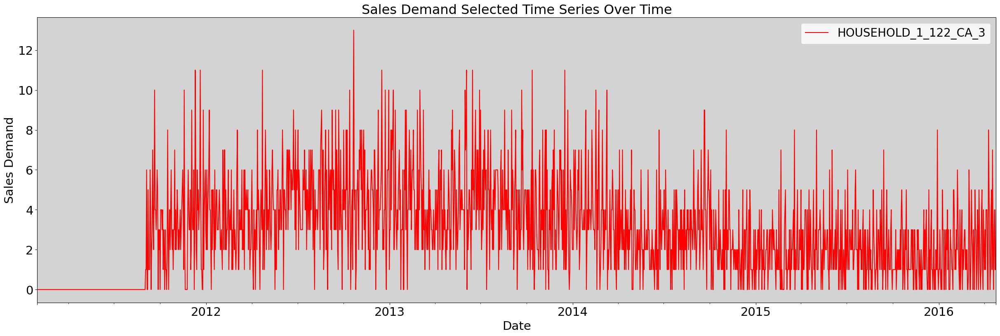

In [50]:
#Select arbitrary index and plot the time series
index = 6780
y = pd.DataFrame(DF_Sales.iloc[:,index])
y = pd.DataFrame(y).set_index([dates_list])
TS_selected = y 
y.index = pd.to_datetime(y.index)
ax = y.plot(figsize=(30, 9),color='red')
ax.set_facecolor('lightgrey')
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.legend(fontsize=20)
plt.title(label = 'Sales Demand Selected Time Series Over Time',fontsize = 23)
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()


In [55]:
SEED = 1345
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True


seed_everything(SEED)

In [56]:
data = np.array(y)
scaler = MinMaxScaler(feature_range=(-1, 1))
train_data_normalized = scaler.fit_transform(data.reshape(-1, 1))

In [57]:
print(train_data_normalized[:5])
print(train_data_normalized[-5:])

[[-1.]
 [-1.]
 [-1.]
 [-1.]
 [-1.]]
[[-0.53846154]
 [-0.38461538]
 [-0.84615385]
 [-0.84615385]
 [-0.38461538]]


<Axes: title={'center': ' After Normalization'}, ylabel='Frequency'>

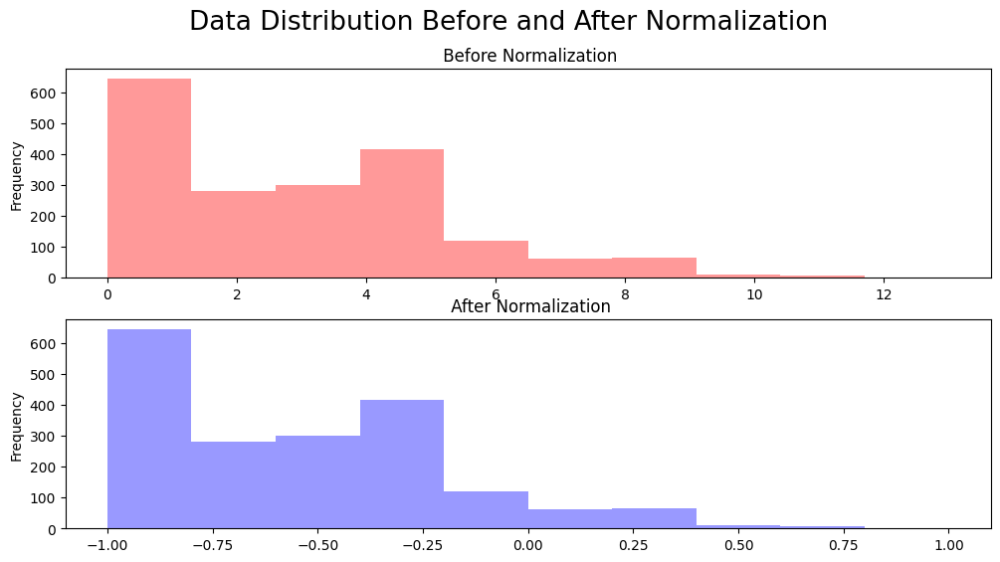

In [58]:
fig, axs = plt.subplots(2)
 
fig.suptitle('Data Distribution Before and After Normalization ',fontsize = 19)
pd.DataFrame(data).plot(kind='hist',ax = axs[0] , alpha=.4 , figsize=[12,6], legend = False,title = ' Before Normalization',color ='red') 
pd.DataFrame(train_data_normalized).plot(kind='hist', ax = axs[1] ,figsize=[12,6], alpha=.4 , legend = False,title = ' After Normalization'\
                                         ,color = 'blue')
   

In [59]:
###  This function creates a sliding window or sequences of 28 days and one day label ####
def sliding_windows(data, seq_length):
    x = []
    y = []

    for i in range(len(data)-seq_length-1):
        _x = data[i:(i+seq_length)]
        _y = data[i+seq_length]
        x.append(_x)
        y.append(_y)

    return np.array(x),np.array(y)

In [60]:
#train_inout_seq = create_inout_sequences(train_data_normalized, train_window)
seq_length = 28
x, y = sliding_windows(train_data_normalized, seq_length)
print(x.shape)
print(y.shape)

(1884, 28, 1)
(1884, 1)


In [63]:
train_size = int(len(y) * 0.67)
test_size = len(y) - train_size

dataX = Variable(torch.Tensor(np.array(x)))
dataY = Variable(torch.Tensor(np.array(y)))

trainX = Variable(torch.Tensor(np.array(x[0:train_size])))
trainY = Variable(torch.Tensor(np.array(y[0:train_size])))

testX = Variable(torch.Tensor(np.array(x[train_size:len(x)])))
testY = Variable(torch.Tensor(np.array(y[train_size:len(y)])))

In [64]:
print("train shape is:",trainX.size())
print("train label shape is:",trainY.size())
print("test shape is:",testX.size())
print("test label shape is:",testY.size())

train shape is: torch.Size([1262, 28, 1])
train label shape is: torch.Size([1262, 1])
test shape is: torch.Size([622, 28, 1])
test label shape is: torch.Size([622, 1])


In [65]:
class LSTM(nn.Module):

    def __init__(self, num_classes, input_size, hidden_size, num_layers):
        super(LSTM, self).__init__()
        
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        #self.seq_length = seq_length
        self.dropout = nn.Dropout(p=0.2)
        
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True,dropout = 0.25)
        
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        h_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size).to(device))
        
        c_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size).to(device))
        
        # Propagate input through LSTM
        ula, (h_out, _) = self.lstm(x, (h_0, c_0))
        
        h_out = h_out.view(-1, self.hidden_size)
        
        out = self.fc(h_out)
        out = self.dropout(out)
       
        return out

In [68]:
#####  Parameters  ######################
num_epochs = 500
device = 'cpu'
learning_rate = 1e-3
input_size = 1
hidden_size = 512
num_layers = 1
num_classes = 1

#####Init the Model #######################
lstm = LSTM(num_classes, input_size, hidden_size, num_layers)
lstm.to(device)

##### Set Criterion Optimzer and scheduler ####################
criterion = torch.nn.MSELoss().to(device)    # mean-squared error for regression
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate,weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,  patience=500,factor =0.5 ,min_lr=1e-7, eps=1e-08)
#optimizer = torch.optim.SGD(lstm.parameters(), lr=learning_rate)

# Train the model

for epoch in progress_bar(range(num_epochs)): 
    lstm.train()
    outputs = lstm(trainX.to(device))
    optimizer.zero_grad()
    
    # obtain the loss function
    loss = criterion(outputs, trainY.to(device))
    
    loss.backward()
    
    
    optimizer.step()
    
    #Evaluate on test     
    lstm.eval()
    valid = lstm(testX.to(device))
    vall_loss = criterion(valid, testY.to(device))
    scheduler.step(vall_loss)
    
    if epoch % 50 == 0:
      print("Epoch: %d, loss: %1.5f valid loss:  %1.5f " %(epoch, loss.cpu().item(),vall_loss.cpu().item()))


Epoch: 0, loss: 0.41933 valid loss:  0.45441 


/Users/zak/anaconda3/envs/DataCamp/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:1340: UserWarning:

Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)



Epoch: 50, loss: 0.17072 valid loss:  0.09814 
Epoch: 100, loss: 0.17670 valid loss:  0.10150 
Epoch: 150, loss: 0.16656 valid loss:  0.09450 
Epoch: 200, loss: 0.15632 valid loss:  0.09265 
Epoch: 250, loss: 0.15422 valid loss:  0.09440 
Epoch: 300, loss: 0.14508 valid loss:  0.10258 
Epoch: 350, loss: 0.14758 valid loss:  0.08952 
Epoch: 400, loss: 0.15626 valid loss:  0.09792 
Epoch: 450, loss: 0.16373 valid loss:  0.09675 


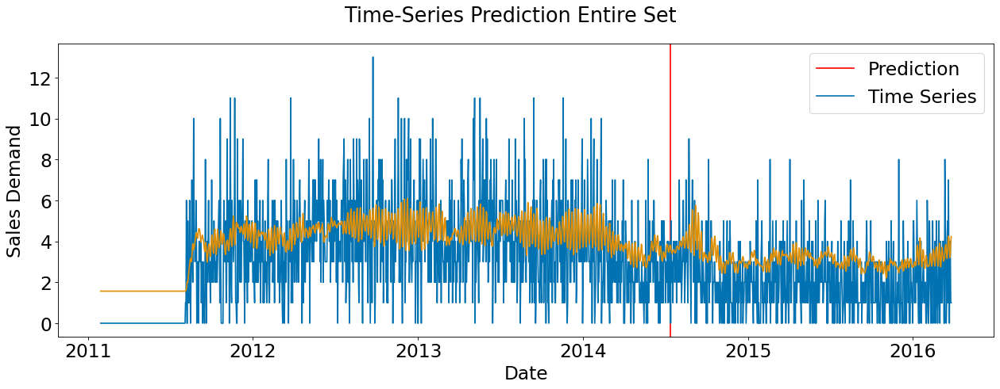

In [71]:
######Prediction###############


lstm.eval()
train_predict = lstm(dataX.to(device))
data_predict = train_predict.cpu().data.numpy()
dataY_plot = dataY.data.numpy()

## Inverse Normalize 
data_predict = scaler.inverse_transform(data_predict)
dataY_plot = scaler.inverse_transform(dataY_plot)

## Add dates
df_predict = pd.DataFrame(data_predict)
df_predict = df_predict.set_index([dates_list[:-29]])
df_labels = pd.DataFrame(dataY_plot)
df_labels = df_labels.set_index([dates_list[:-29]])

# Plot 
figure(num=None, figsize=(19, 6), dpi=80, facecolor='w', edgecolor='k')
plt.axvline(x=dates_list[train_size], c='r')
plt.plot( df_labels[0])
plt.plot(df_predict[0])
plt.legend(['Prediction','Time Series'],fontsize = 21)
plt.suptitle('Time-Series Prediction Entire Set',fontsize = 23)
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()


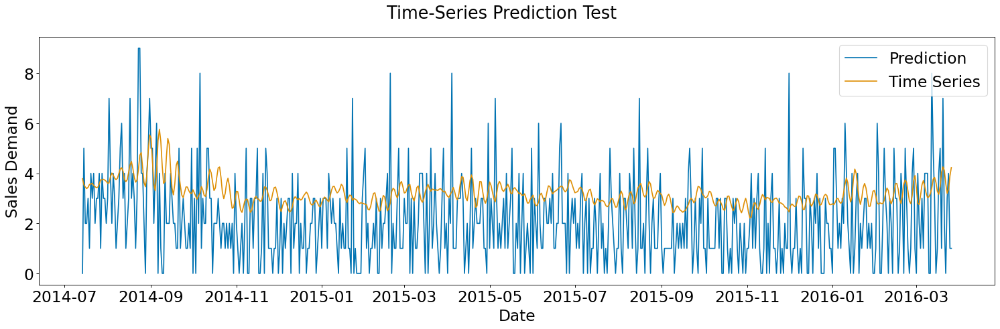

In [72]:

#######Plot the test set ##########################
figure(num=None, figsize=(23, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df_labels.iloc[-testX.size()[0]:][0])
plt.plot(df_predict.iloc[-testX.size()[0]:][0])
plt.legend(['Prediction','Time Series'],fontsize = 21)
plt.suptitle('Time-Series Prediction Test',fontsize = 23)
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()

In [73]:
np.sqrt(((dataY_plot[-testX.size()[0]:] - data_predict[-testX.size()[0]:] ) ** 2).mean())

2.0047925

## LSTM model with multiple layers

In [74]:
class LSTM2(nn.Module):

    def __init__(self, num_classes, input_size, hidden_size, num_layers):
        super(LSTM2, self).__init__()
        
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        
        self.batch_size = 1
        #self.seq_length = seq_length
        
        self.LSTM2 = nn.LSTM(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers,batch_first=True,dropout = 0.25)
       
        
        
        self.fc = nn.Linear(hidden_size, num_classes)
        self.dropout = nn.Dropout(p=0.2)
    def forward(self, x):
        h_1 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size).to(device))
         
        
        c_1 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size).to(device))
        
       
        _, (hn, cn) = self.LSTM2(x, (h_1, c_1))
     
        #print("hidden state shpe is:",hn.size())
        y = hn.view(-1, self.hidden_size)
        
        final_state = hn.view(self.num_layers, x.size(0), self.hidden_size)[-1]
        #print("final state shape is:",final_state.shape)
        out = self.fc(final_state)
        #out = self.dropout(out)
        #print(out.size())
        return out
    
   
        
       
        

In [75]:
def init_weights(m):
    for name, param in m.named_parameters():
        nn.init.uniform_(param.data, -0.08, 0.08)
        


In [76]:
num_epochs = 700
learning_rate = 1e-3
input_size = 1
hidden_size = 512
num_layers = 2

num_classes = 1

lstm = LSTM2(num_classes, input_size, hidden_size, num_layers)
lstm.to(device)


lstm.apply(init_weights)

criterion = torch.nn.MSELoss().to(device)    # mean-squared error for regression
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate,weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,  patience=100, factor =0.5 ,min_lr=1e-7, eps=1e-08)
#optimizer = torch.optim.SGD(lstm.parameters(), lr=learning_rate)

# Train the model

for epoch in progress_bar(range(num_epochs)): 
    lstm.train()
    outputs = lstm(trainX.to(device))
    optimizer.zero_grad()
    torch.nn.utils.clip_grad_norm_(lstm.parameters(), 1)
    # obtain the loss function
    loss = criterion(outputs, trainY.to(device))
    
    loss.backward()
    
    scheduler.step(loss)
    optimizer.step()
    lstm.eval()
    valid = lstm(testX.to(device))
    vall_loss = criterion(valid, testY.to(device))
    scheduler.step(vall_loss)
    
    if epoch % 50 == 0:
      print("Epoch: %d, loss: %1.5f valid loss:  %1.5f " %(epoch, loss.cpu().item(),vall_loss.cpu().item()))

Epoch: 0, loss: 0.39708 valid loss:  0.07288 
Epoch: 50, loss: 0.10187 valid loss:  0.07428 
Epoch: 100, loss: 0.09919 valid loss:  0.06797 
Epoch: 150, loss: 0.09428 valid loss:  0.07122 
Epoch: 200, loss: 0.09321 valid loss:  0.07173 
Epoch: 250, loss: 0.09286 valid loss:  0.07243 
Epoch: 300, loss: 0.09208 valid loss:  0.07276 
Epoch: 350, loss: 0.09214 valid loss:  0.07292 
Epoch: 400, loss: 0.09191 valid loss:  0.07288 
Epoch: 450, loss: 0.09167 valid loss:  0.07295 
Epoch: 500, loss: 0.09143 valid loss:  0.07294 
Epoch: 550, loss: 0.09162 valid loss:  0.07290 
Epoch: 600, loss: 0.09123 valid loss:  0.07291 
Epoch: 650, loss: 0.09119 valid loss:  0.07292 


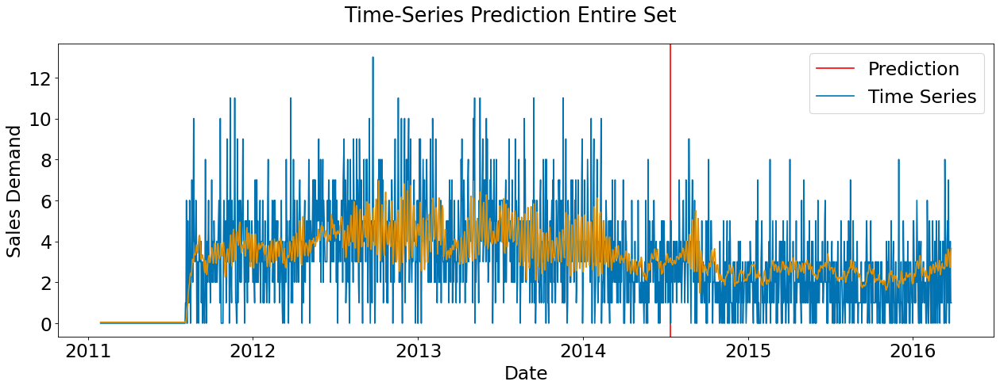

In [77]:
######Prediction###############


lstm.eval()
train_predict = lstm(dataX.to(device))
data_predict = train_predict.cpu().data.numpy()
dataY_plot = dataY.data.numpy()

## Inverse Normalize 
data_predict = scaler.inverse_transform(data_predict)
dataY_plot = scaler.inverse_transform(dataY_plot)

## Add dates
df_predict = pd.DataFrame(data_predict)
df_predict = df_predict.set_index([dates_list[:-29]])
df_labels = pd.DataFrame(dataY_plot)
df_labels = df_labels.set_index([dates_list[:-29]])

# Plot 
figure(num=None, figsize=(19, 6), dpi=80, facecolor='w', edgecolor='k')
plt.axvline(x=dates_list[train_size], c='r')
plt.plot( df_labels[0])
plt.plot(df_predict[0])
plt.legend(['Prediction','Time Series'],fontsize = 21)
plt.suptitle('Time-Series Prediction Entire Set',fontsize = 23)
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()


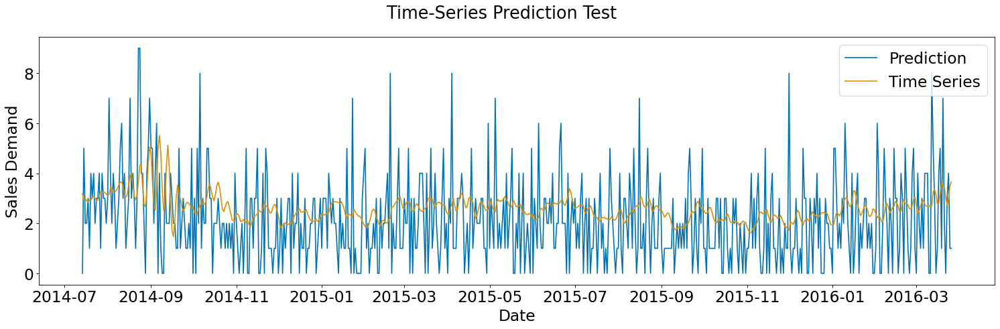

In [78]:

#######Plot the test set ##########################
figure(num=None, figsize=(23, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df_labels.iloc[-testX.size()[0]:][0])
plt.plot(df_predict.iloc[-testX.size()[0]:][0])
plt.legend(['Prediction','Time Series'],fontsize = 21)
plt.suptitle('Time-Series Prediction Test',fontsize = 23)
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()

In [79]:
np.sqrt(((dataY_plot[-testX.size()[0]:] - data_predict[-testX.size()[0]:] ) ** 2).mean())

1.7553077

## LSTM model with multiple features

In [80]:
# Re-Use the Time Series we have selected earlier
DF = TS_selected
colnames = DF.columns
DF = DF.rename(columns={colnames[0]:'sales'})
DF.tail()

,sales
2016-04-20,3
2016-04-21,4
2016-04-22,1
2016-04-23,1
2016-04-24,4


### Lag features

In [83]:
start_time = time.time()
for i in (1,7,14,28,365):
    print('Shifting:', i)
    DF['lag_'+str(i)] = DF['sales'].transform(lambda x: x.shift(i))
print('%0.2f min: Time for bulk shift' % ((time.time() - start_time) / 60))


Shifting: 1
Shifting: 7
Shifting: 14
Shifting: 28
Shifting: 365
0.00 min: Time for bulk shift


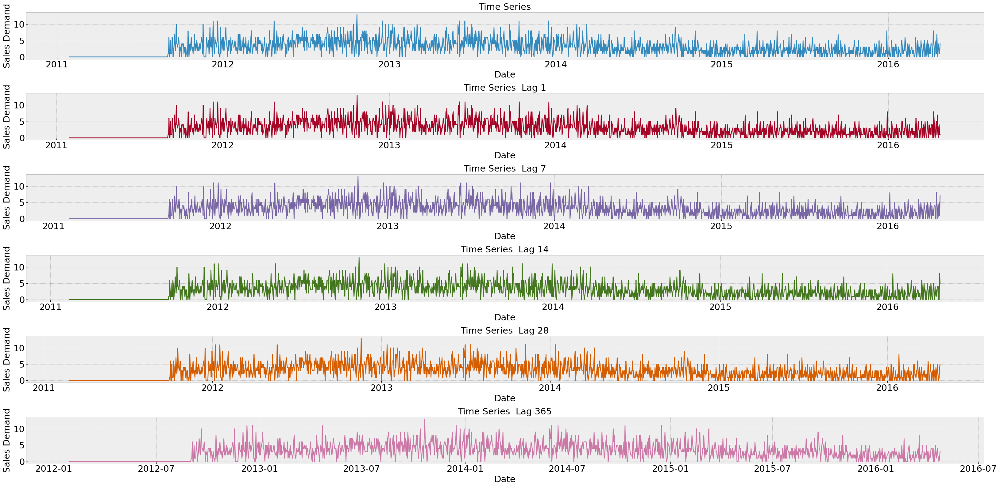

In [86]:
 
DF = DF.set_index([dates_list])
Product = "Time Series"

################Create Plot ##############################################
fig, axs = plt.subplots(6, 1, figsize=(33, 16))
axs = axs.flatten()
ax_idx = 0

for i in (0,1,7,14,28,365):
    if i == 0:
        ax = DF['sales'].plot(fontsize = 21,
                     legend =False,
                     color=next(color_cycle),
                     ax=axs[ax_idx])
        ax.set_ylabel("Sales Demand",fontsize = 21)
        ax.set_xlabel("Date",fontsize = 21)
        ax.set_title(fontsize = 21,label = Product)

        ax_idx += 1
    else : 
        ax = DF[f'lag_{i}'].plot(fontsize = 21,
                     legend =False,
                     color=next(color_cycle),
                     ax=axs[ax_idx])
        ax.set_ylabel("Sales Demand",fontsize = 21)
        ax.set_xlabel("Date",fontsize = 21)
        ax.set_title(fontsize = 21,label = Product+f'  Lag {i}')

        ax_idx += 1
    
   
   
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )

plt.tight_layout()
plt.show()


### Rolling window features

In [90]:
start_time = time.time()

for i in [7,14,28,60,180,365]:
    print('Rolling period:', i)
    DF['rolling_mean_'+str(i)] = DF['sales'].transform(lambda x: x.shift(28).rolling(i).mean())
    DF['rolling_std_'+str(i)]  = DF['sales'].transform(lambda x: x.shift(28).rolling(i).std())

DF = DF.replace('nan', np.nan).fillna(0)

print('%0.2f min: Time for loop' % ((time.time() - start_time) / 60))
DF.head()


Rolling period: 7
Rolling period: 14
Rolling period: 28
Rolling period: 60
Rolling period: 180
Rolling period: 365
0.00 min: Time for loop


,sales,lag_1,lag_7,lag_14,lag_28,lag_365,rolling_mean_7,rolling_std_7,rolling_mean_14,rolling_std_14,rolling_mean_28,rolling_std_28,rolling_mean_60,rolling_std_60,rolling_mean_180,rolling_std_180,rolling_mean_365,rolling_std_365
2011-01-29,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-01-30,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-01-31,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-02-01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-02-02,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Normalization

In [93]:
DF_normlized = DF.copy(deep=True)
scaler = MinMaxScaler(feature_range=(-1, 1))
y_scaler = MinMaxScaler(feature_range=(-1, 1))
scaled_data = scaler.fit_transform(DF) 
y_scaler.fit_transform(DF['sales'].values.reshape(-1, 1))
DF_normlized.iloc[:,:] =  scaled_data
DF_normlized.head()

,sales,lag_1,lag_7,lag_14,lag_28,lag_365,rolling_mean_7,rolling_std_7,rolling_mean_14,rolling_std_14,rolling_mean_28,rolling_std_28,rolling_mean_60,rolling_std_60,rolling_mean_180,rolling_std_180,rolling_mean_365,rolling_std_365
2011-01-29,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2011-01-30,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2011-01-31,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2011-02-01,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2011-02-02,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


### Day of the week

In [94]:
DF_normlized = DF_normlized.reset_index()
DF_normlized = DF_normlized.rename(columns={'index':'date'})
DF_normlized.head()
DF_normlized['date'] = DF_normlized['date'].apply(lambda x: x.strftime("%Y-%m-%d"))
DF_normlized = DF_normlized.merge(calendar_df[['date','weekday']],on='date')
DF_normlized.head()

,date,sales,lag_1,lag_7,lag_14,lag_28,lag_365,rolling_mean_7,rolling_std_7,rolling_mean_14,rolling_std_14,rolling_mean_28,rolling_std_28,rolling_mean_60,rolling_std_60,rolling_mean_180,rolling_std_180,rolling_mean_365,rolling_std_365,weekday
0,2011-01-29,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,Saturday
1,2011-01-30,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,Sunday
2,2011-01-31,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,Monday
3,2011-02-01,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,Tuesday
4,2011-02-02,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,Wednesday


In [95]:
## Adding the embedded vectors 
DF_normlized['wd1'] =0
DF_normlized['wd2'] =0
DF_normlized['wd3'] =0
DF_normlized['wd4'] =0

DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Sunday'] , DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Sunday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Sunday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Sunday']= 0.4 ,-0.3 ,0.6,0.1

DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Monday'] , DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Monday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Monday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Monday']= 0.2 ,0.2 ,0.5,-0.3

DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Tuesday'] ,DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Tuesday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Tuesday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Tuesday']= 0.1,-1.0,1.3,0.9

DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Wednesday'] , DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Wednesday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Wednesday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Wednesday']= -0.6,0.5,1.2,0.7

DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Thursday'] , DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Thursday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Thursday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Thursday']= 0.9,0.2,-0.1,0.6

DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Friday'] , DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Friday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Friday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Friday']= 0.4,1.1,0.3,-1.5


DF_normlized.loc[:,'wd1'][DF_normlized['weekday'] =='Saturday'] , DF_normlized.loc[:,'wd2'][DF_normlized['weekday'] =='Saturday'],\
DF_normlized.loc[:,'wd3'][DF_normlized['weekday'] =='Saturday'] , DF_normlized.loc[:,'wd4'][DF_normlized['weekday'] =='Saturday']= 0.3,-0.2,0.6,0.0


Comparing original and normalized data as a sanity check

<Axes: title={'center': ' After Normalization'}, ylabel='Frequency'>

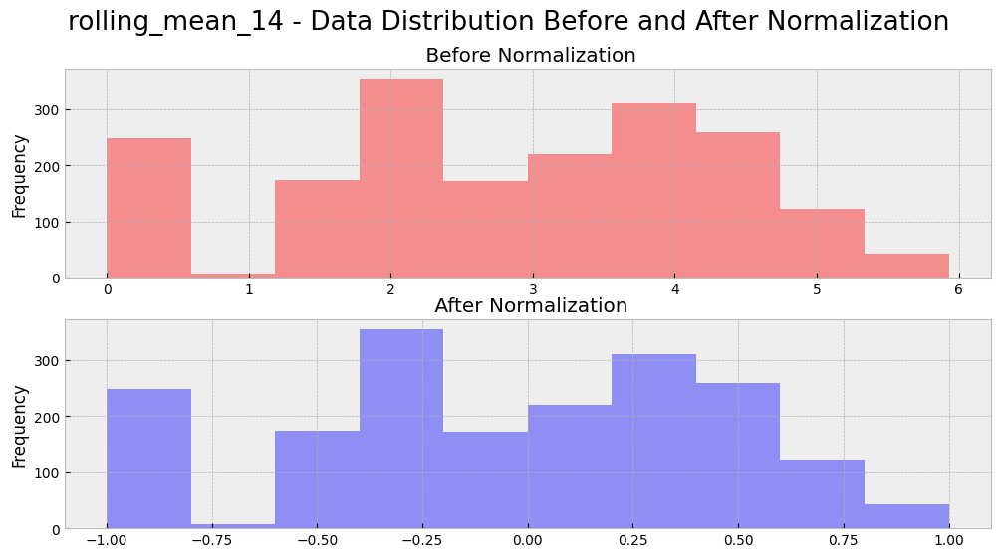

In [96]:
fig, axs = plt.subplots(2)
 
fig.suptitle('rolling_mean_14 - Data Distribution Before and After Normalization ',fontsize = 19)
pd.DataFrame(DF['rolling_mean_14']).plot(kind='hist',ax = axs[0] , alpha=.4 , figsize=[12,6], legend = False,title = ' Before Normalization',color ='red') 
pd.DataFrame(DF_normlized['rolling_mean_14']).plot(kind='hist', ax = axs[1] ,figsize=[12,6], alpha=.4 , legend = False,title = ' After Normalization'\
                                         ,color = 'blue')

### Multidimentional sliding window

In [97]:
###  This function creates a sliding window or sequences of 28 days and one day label ####
###  For Multiple features                                                            ####
def sliding_windows_mutli_features(data, seq_length):
    x = []
    y = []

    for i in range((data.shape[0])-seq_length-1):
        _x = data[i:(i+seq_length),:] ## 16 columns for features  
        _y = data[i+seq_length,0] ## column 0 contains the labbel
        x.append(_x)
        y.append(_y)

    return np.array(x),np.array(y).reshape(-1,1)

In [98]:
# Select only the features and the target for prediction  
data_with_features = DF_normlized[["sales","lag_7","lag_1","lag_28","lag_365","rolling_mean_7",\
"rolling_std_7","rolling_mean_14","rolling_std_14","rolling_mean_28","rolling_std_28","rolling_mean_60","rolling_std_60",'lag_28','wd1','wd2','wd3','wd4']].to_numpy()             

#data_with_features = DF_normlized['sales'].to_numpy().reshape(-1,1)
data_with_features.shape

(1913, 18)

Creating sliding window dataset

In [99]:
x , y = sliding_windows_mutli_features(data_with_features,seq_length=28)
print("X_data shape is",x.shape)
print("y_data shape is",y.shape)

X_data shape is (1884, 28, 18)
y_data shape is (1884, 1)


### PyTorch Tensors

In [100]:
train_size = int(len(y) * 0.67)
test_size = len(y) - train_size

dataX = Variable(torch.Tensor(np.array(x)))
dataY = Variable(torch.Tensor(np.array(y)))

trainX = Variable(torch.Tensor(np.array(x[0:train_size])))
trainY = Variable(torch.Tensor(np.array(y[0:train_size])))

testX = Variable(torch.Tensor(np.array(x[train_size:len(x)])))
testY = Variable(torch.Tensor(np.array(y[train_size:len(y)])))


print("train shape is:",trainX.size())
print("train label shape is:",trainY.size())
print("test shape is:",testX.size())
print("test label shape is:",testY.size())

train shape is: torch.Size([1262, 28, 18])
train label shape is: torch.Size([1262, 1])
test shape is: torch.Size([622, 28, 18])
test label shape is: torch.Size([622, 1])


### LSTM model

In [101]:
class LSTM2(nn.Module):

    def __init__(self, num_classes, input_size, hidden_size, num_layers):
        super(LSTM2, self).__init__()
        
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        
        self.batch_size = 1
        #self.seq_length = seq_length
        
        self.LSTM2 = nn.LSTM(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers,batch_first=True,dropout = 0.2)
       
        
        
        self.fc1 = nn.Linear(hidden_size,256)
        self.bn1 = nn.BatchNorm1d(256,eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.dp1 = nn.Dropout(0.25)
        
        self.fc2 = nn.Linear(256, 128)
            
        self.bn2 = nn.BatchNorm1d(128,eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.dp2 = nn.Dropout(0.2)
        self.fc3= nn.Linear(128, 1)
        self.relu = nn.ReLU()
       
    def forward(self, x):
        h_1 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size).to(device))
         
        
        c_1 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size).to(device))
        
       
        _, (hn, cn) = self.LSTM2(x, (h_1, c_1))
     
        #print("hidden state shpe is:",hn.size())
        y = hn.view(-1, self.hidden_size)
        
        final_state = hn.view(self.num_layers, x.size(0), self.hidden_size)[-1]
        #print("final state shape is:",final_state.shape)
        
        x0 = self.fc1(final_state)
        x0 = self.bn1(x0)
        x0 = self.dp1(x0)
        x0 = self.relu(x0)
        
        x0 = self.fc2(x0)
        x0 = self.bn2(x0)
        x0 = self.dp2(x0)
        
        x0 = self.relu(x0)
        
        out = self.fc3(x0)
        #print(out.size())
        return out
    
   

### Training loop

Will save the best model with respect to the validation loss

In [102]:
num_epochs = 500
learning_rate = 1e-3
input_size = 18
hidden_size = 512
num_layers = 4
num_classes = 1

best_val_loss = 100

lstm = LSTM2(num_classes, input_size, hidden_size, num_layers)
lstm.to(device)


lstm.apply(init_weights)

criterion = torch.nn.MSELoss().to(device)    # mean-squared error for regression
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate,weight_decay=1e-5)
#optimizer = torch.optim.SGD(lstm.parameters(), lr=0.01, momentum=0.9,weight_decay=1e-5)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,  patience=50, factor =0.5 ,min_lr=1e-7, eps=1e-08)
#scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max = 5e-3, eta_min=1e-8, last_epoch=-1)
#optimizer = torch.optim.SGD(lstm.parameters(), lr=learning_rate)

# Train the model

for epoch in progress_bar(range(num_epochs)): 
    lstm.train()
    outputs = lstm(trainX.to(device))
    optimizer.zero_grad()
    torch.nn.utils.clip_grad_norm_(lstm.parameters(), 1)
    # obtain the loss function
    loss = criterion(outputs, trainY.to(device))
    
    loss.backward()
    #torch.nn.utils.clip_grad_norm_(lstm.parameters(), 1)
    
    optimizer.step()
    lstm.eval()
    valid = lstm(testX.to(device))
    vall_loss = criterion(valid, testY.to(device))
    scheduler.step(vall_loss)
    #scheduler.step()
    
    if vall_loss.cpu().item() < best_val_loss:
         torch.save(lstm.state_dict(), 'best_model.pt')
         print("saved best model epoch:",epoch,"val loss is:",vall_loss.cpu().item())
         best_val_loss = vall_loss.cpu().item()
        
    
    if epoch % 50 == 0:
      print("Epoch: %d, loss: %1.5f valid loss:  %1.5f " %(epoch, loss.cpu().item(),vall_loss.cpu().item()))

saved best model epoch: 0 val loss is: 0.5006424188613892
Epoch: 0, loss: 0.37474 valid loss:  0.50064 
saved best model epoch: 1 val loss is: 0.492314875125885
saved best model epoch: 2 val loss is: 0.4836392402648926
saved best model epoch: 3 val loss is: 0.4749455451965332
saved best model epoch: 4 val loss is: 0.4662988781929016
saved best model epoch: 5 val loss is: 0.4576844871044159
saved best model epoch: 6 val loss is: 0.4489533603191376
saved best model epoch: 7 val loss is: 0.44052615761756897
saved best model epoch: 8 val loss is: 0.4352894723415375
saved best model epoch: 9 val loss is: 0.42158788442611694
saved best model epoch: 10 val loss is: 0.4037977457046509
saved best model epoch: 11 val loss is: 0.38728395104408264
saved best model epoch: 12 val loss is: 0.373455286026001
saved best model epoch: 13 val loss is: 0.36295145750045776
saved best model epoch: 14 val loss is: 0.35628587007522583
saved best model epoch: 15 val loss is: 0.3521822988986969
saved best model 

## Predictions

(1884, 1)
(1884, 1)


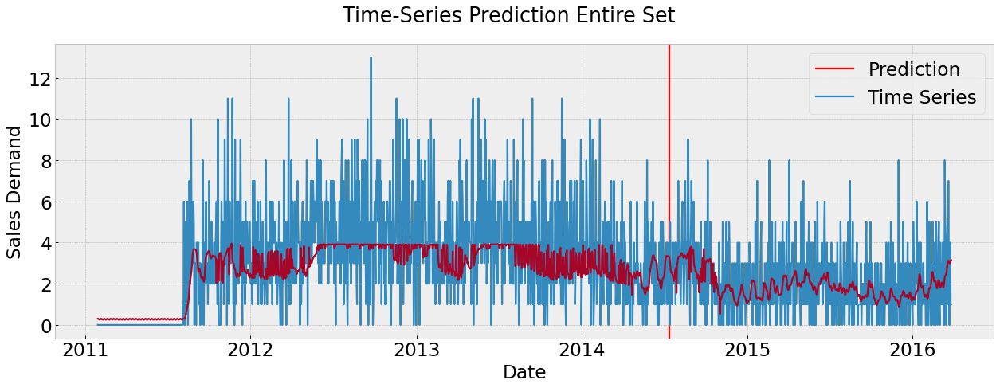

In [103]:
######Prediction###############
lstm.load_state_dict(torch.load('best_model.pt'))

lstm.eval()
train_predict = lstm(dataX.to(device))
data_predict = train_predict.cpu().data.numpy()
dataY_plot = dataY.data.numpy()
print(data_predict.shape)
print(dataY_plot.shape)


## Inverse Normalize 
data_predict = y_scaler.inverse_transform(data_predict)
dataY_plot = y_scaler.inverse_transform(dataY_plot.reshape(-1, 1))

## Add dates
df_predict = pd.DataFrame(data_predict)
df_predict = df_predict.set_index([dates_list[:-29]])
df_labels = pd.DataFrame(dataY_plot)
df_labels = df_labels.set_index([dates_list[:-29]])

# Plot 
figure(num=None, figsize=(19, 6), dpi=80, facecolor='w', edgecolor='k')
plt.axvline(x=dates_list[train_size], c='r')
plt.plot( df_labels[0])
plt.plot(df_predict[0])
plt.legend(['Prediction','Time Series'],fontsize = 21)
plt.suptitle('Time-Series Prediction Entire Set',fontsize = 23)
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()


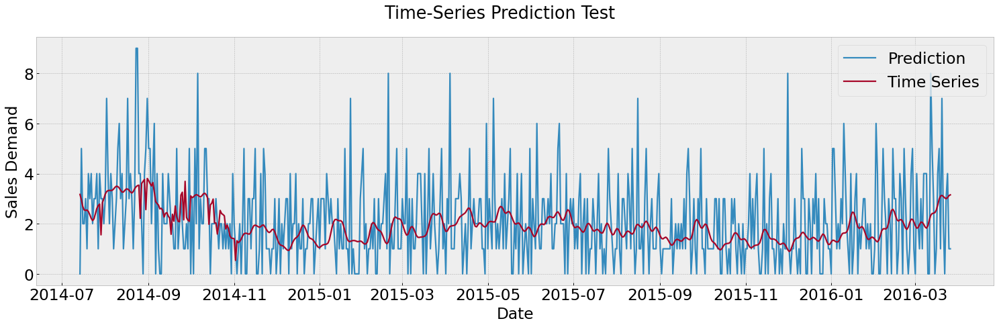

In [104]:

#######Plot the test set ##########################
figure(num=None, figsize=(23, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df_labels.iloc[-testX.size()[0]:][0])
plt.plot(df_predict.iloc[-testX.size()[0]:][0])
plt.legend(['Prediction','Time Series'],fontsize = 21)
plt.suptitle('Time-Series Prediction Test',fontsize = 23)
plt.xticks(fontsize=21 )
plt.yticks(fontsize=21 )
plt.ylabel(ylabel = 'Sales Demand',fontsize = 21)
plt.xlabel(xlabel = 'Date',fontsize = 21)
plt.show()

In [105]:
np.sqrt(((dataY_plot[-testX.size()[0]:] - data_predict[-testX.size()[0]:] ) ** 2).mean())

1.6835796

10:10:07 - cmdstanpy - INFO - Chain [1] start processing
10:10:07 - cmdstanpy - INFO - Chain [1] done processing
10:10:07 - cmdstanpy - INFO - Chain [1] done processing


Prophet RMSE on last 28 days (product-level): 2.584


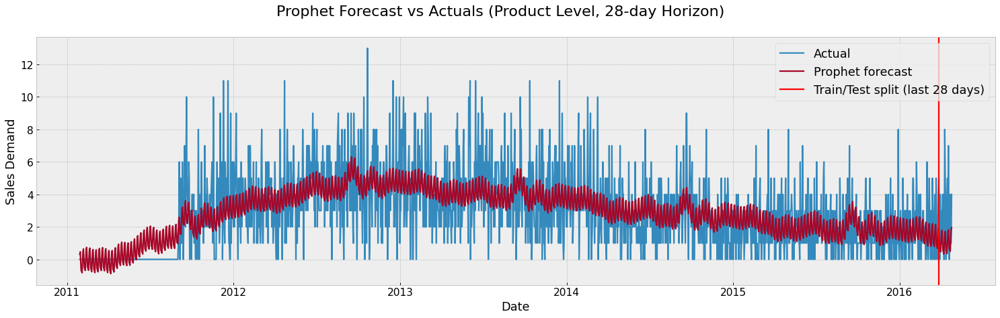

In [108]:
from prophet import Prophet
from sklearn.metrics import mean_squared_error
import numpy as np

# Prepare data for Prophet using the same single-product series
df_prophet = TS_selected.copy()
colnames = df_prophet.columns
df_prophet = df_prophet.rename(columns={colnames[0]: "y"})
df_prophet["ds"] = dates_list
df_prophet = df_prophet[["ds", "y"]]

# Fixed 28-day forecast horizon for apples-to-apples comparison
horizon = 28
train_prophet = df_prophet.iloc[:-horizon].copy()
test_prophet = df_prophet.iloc[-horizon:].copy()

m_product = Prophet(daily_seasonality=True, yearly_seasonality=True, weekly_seasonality=True)
m_product.fit(train_prophet)

future_product = m_product.make_future_dataframe(periods=horizon)
forecast_product = m_product.predict(future_product)

# Align forecasts with the 28-day test period
forecast_test = forecast_product.set_index("ds").loc[test_prophet["ds"].values]
y_true = test_prophet["y"].values
y_pred = forecast_test["yhat"].values

rmse_prophet_28 = np.sqrt(mean_squared_error(y_true, y_pred))
print(f"Prophet RMSE on last {horizon} days (product-level): {rmse_prophet_28:.3f}")

# Plot full series with Prophet forecast and highlight 28-day horizon
figure(num=None, figsize=(23, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(df_prophet.set_index("ds")["y"], label="Actual")
plt.plot(forecast_product.set_index("ds")["yhat"], label="Prophet forecast")
plt.axvline(x=train_prophet.iloc[-1]["ds"], c="r", label="Train/Test split (last 28 days)")
plt.legend(fontsize=16)
plt.suptitle("Prophet Forecast vs Actuals (Product Level, 28-day Horizon)", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel("Sales Demand", fontsize=16)
plt.xlabel("Date", fontsize=16)
plt.show()

10:17:13 - cmdstanpy - INFO - Chain [1] start processing
10:17:13 - cmdstanpy - INFO - Chain [1] done processing
10:17:13 - cmdstanpy - INFO - Chain [1] done processing


Prophet RMSE on full LSTM test horizon (product-level): 1.906


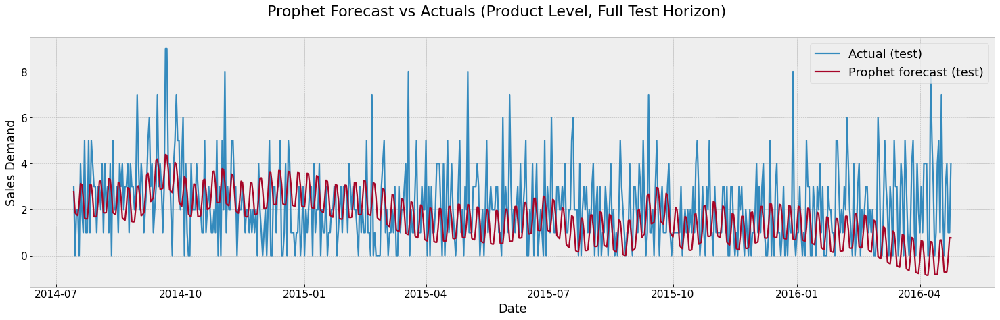

In [109]:
# Prophet evaluation using the same train/test split as the LSTM models (full test horizon)
from sklearn.metrics import mean_squared_error
import numpy as np

# Reuse df_prophet built above (ds, y) and LSTM train_size
train_size_lstm = train_size
train_prophet_full = df_prophet.iloc[:train_size_lstm].copy()
test_prophet_full = df_prophet.iloc[train_size_lstm:].copy()

m_product_full = Prophet(daily_seasonality=True, yearly_seasonality=True, weekly_seasonality=True)
m_product_full.fit(train_prophet_full)

# Forecast over the full LSTM test horizon
future_full = m_product_full.make_future_dataframe(periods=len(test_prophet_full))
forecast_full = m_product_full.predict(future_full)

# Align forecasts with the full test period
forecast_test_full = forecast_full.set_index("ds").loc[test_prophet_full["ds"].values]
y_true_full = test_prophet_full["y"].values
y_pred_full = forecast_test_full["yhat"].values

rmse_prophet_full = np.sqrt(mean_squared_error(y_true_full, y_pred_full))
print(f"Prophet RMSE on full LSTM test horizon (product-level): {rmse_prophet_full:.3f}")

# Plot test portion only for visual comparison
figure(num=None, figsize=(23, 6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(test_prophet_full.set_index("ds")["y"], label="Actual (test)")
plt.plot(forecast_test_full["yhat"], label="Prophet forecast (test)")
plt.legend(fontsize=16)
plt.suptitle("Prophet Forecast vs Actuals (Product Level, Full Test Horizon)", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel("Sales Demand", fontsize=16)
plt.xlabel("Date", fontsize=16)
plt.show()

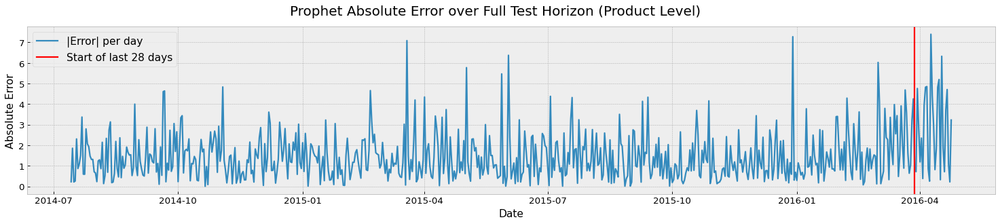

Mean absolute error over full test horizon: 1.47522777332545
Mean absolute error over last 28 days: 2.7639898238253093


In [111]:
# Error profile over full test horizon for Prophet (product-level)
import numpy as np

# Absolute error per day on the full test horizon
abs_err_full = np.abs(y_true_full - y_pred_full)

figure(num=None, figsize=(23, 4), dpi=80, facecolor='w', edgecolor='k')
plt.plot(test_prophet_full["ds"], abs_err_full, label="|Error| per day")
plt.axvline(x=test_prophet_full["ds"].iloc[-28], color="r", label="Start of last 28 days")
plt.legend(fontsize=14)
plt.suptitle("Prophet Absolute Error over Full Test Horizon (Product Level)", fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel("Absolute Error", fontsize=14)
plt.xlabel("Date", fontsize=14)
plt.show()

print("Mean absolute error over full test horizon:", abs_err_full.mean())
print("Mean absolute error over last 28 days:", abs_err_full[-28:].mean())